### Installs

In [1]:
!pip install transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 45.0 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.3/190.3 KB 21.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 79.3 MB/s eta 0:00:00:00:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 772.3/772.3 KB 49.1 MB/s eta 0:00:00
You should consider upgrading via the '/usr/local/bin/python -m pip install --upgrade pip' command.


### Imports

In [2]:
import torch_xla
import torch_xla.debug.metrics as met
import torch_xla.distributed.data_parallel as dp
import torch_xla.distributed.parallel_loader as pl
import torch_xla.utils.utils as xu
import torch_xla.core.xla_model as xm
import torch_xla.distributed.xla_multiprocessing as xmp
import torch_xla.test.test_utils as test_utils
import warnings

warnings.filterwarnings("ignore")

from torch.utils.data.distributed import DistributedSampler
from transformers import CLIPTokenizerFast as CLIPTokenizer, CLIPTextModel
from torch.utils.data import Dataset, DataLoader
from torch.optim.lr_scheduler import LambdaLR
from torchvision.models import vgg16
from multiprocessing import cpu_count
from transformers import logging
from torch.optim import Adam
from tqdm.auto import tqdm
from textwrap import wrap
from PIL import Image
import torch.multiprocessing as mp
import matplotlib.pyplot as plt
import torch.nn.functional as F
import tensorflow as tf
import torch.nn as nn
import numpy as np
import torch, glob, os, gc, wandb, math

logging.set_verbosity_error() # disables the "Some weights failed to load" for the CLIP text model (non-issue, these failed weights are for the ViT and aren't used anyway)
os.environ['XLA_DOWNCAST_BF16'] = '1'
DEBUG = False
USE_WANDB = True

if USE_WANDB:
    from kaggle_secrets import UserSecretsClient
    user_secrets = UserSecretsClient()
    #wab_key = user_secrets.get_secret("wab_key")
    wab_key = 'b197b6dc0ef1b552165d2a823e3572b62044cdb8'

    os.environ['WANDB_API_KEY'] = wab_key

/usr/local/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
[percpu.cc : 524] RAW: Failed to initialize RSEQ VCPUs in mode 1, error = 1
[percpu.cc : 557] RAW: rseq syscall failed with errno 1
[percpu.cc : 552] RAW: rseq syscall failed with errno 1


### Hyperparameters

In [3]:
EPOCHS = 1250
STEPS_PER_EPOCH = 1024
CROP_SIZE = 256
BATCH_SIZE = 512
STEPS_PER_LOG = 16
    
DS_PATH = '/kaggle/input/laion-5b-65-aesthetic-256x256-tfrecords'

WANDB_RUN_PATH = WANDB_MODEL_FNAME = WANDB_VAE_RUN_PATH = WANDB_VAE_MODEL_FNAME = None
WANDB_RUN_PATH = 'tiewa_enguin/tpu_ldm_ddpm/1kgfg99t'
WANDB_MODEL_FNAME = 'ddpm_0021.pth'
WANDB_VAE_RUN_PATH = 'tiewa_enguin/ldm_vae/yh3bzez3'
WANDB_VAE_MODEL_FNAME = 'vae_0090.pth'
CLIP_VERSION = 'openai/clip-vit-large-patch14'
MAX_TOKENS = 77

CKPT_DIR = '/kaggle/working'
# save dirs may be different from load dirs if load dirs are unwritable (e.g. /kaggle/input)
CKPT_SAVE_DIR = '/kaggle/working/checkpoints'

LEARNING_RATE = 1e-6 * BATCH_SIZE
LR_WARMUP_STEPS = 4000

VAE_NC = 64
VAE_CH_MULTS = [1, 2, 2, 4]
VAE_NLAYERS_PER_RES = 2
VAE_NZ = 16

DDPM_NC = 256
DDPM_CH_MULTS = [1, 2, 4]
DDPM_NLAYERS_PER_RES = 2
DDPM_NZ = 16

if DEBUG:
    STEPS_PER_EPOCH = 128
    BATCH_SIZE = 128
    STEPS_PER_LOG = 1
    CLIP_VERSION = 'openai/clip-vit-base-patch32'

    VAE_NC = 32
    VAE_CH_MULTS = [1, 1, 1, 1]
    VAE_NLAYERS_PER_RES = 1
    VAE_NZ = 16

    DDPM_NC = 32
    DDPM_CH_MULTS = [1, 1]
    DDPM_NLAYERS_PER_RES = 1
    DDPM_NZ = 16

TEXT_CONTEXT_DIM = 768 if 'large' in CLIP_VERSION else 512

### Dataset

TFRecord Helper Funcs

In [4]:
@tf.function(jit_compile=True)
def scale_nchw(img):
    return tf.transpose(tf.cast(img , 'float32') / 127.5 - 1.0, (2, 0, 1))

tokenizer = CLIPTokenizer.from_pretrained(CLIP_VERSION)

def image_feature(value):
    return tf.train.Feature(
        bytes_list=tf.train.BytesList(value=[value.numpy()])
    )

def bytes_feature(value):
    return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value.encode()]))

def create_example(image, caption):
    feature = {
        'image': image_feature(image),
        'caption': bytes_feature(caption),
    }
    return tf.train.Example(features=tf.train.Features(feature=feature))

def parse_tfrecord_fn(example):
    feature_description = {
        'image': tf.io.FixedLenFeature([], tf.string),
        'caption': tf.io.FixedLenFeature([],tf.string),
    }
    example = tf.io.parse_single_example(example, feature_description)
    example['image'] = scale_nchw(tf.io.decode_jpeg(example['image']))
    '''example['caption_tokens'] = tokenizer(
        str(example['caption']), truncation=True,
        max_length=MAX_TOKENS, return_length=True, return_overflowing_tokens=False,
        padding="max_length")['input_ids']'''

    return example

AUTO = tf.data.experimental.AUTOTUNE

### Layers

Residual Block

In [5]:
class ResBlock(nn.Module):
    def __init__(self, in_c: int, nc: int, temb_c: int = None):
        '''
        in_c: number of input channels
        nc: number of output channels
        temb_c: number of t (time?) embedding input channels (or None if no time embedding)
        '''
        super().__init__()
        self.in_c = in_c
        self.nc = nc
        self.norm1 = nn.GroupNorm(8, in_c)
        self.conv1 = nn.Conv2d(in_c, nc, 3, padding=1)
        self.norm2 = nn.GroupNorm(8, nc)
        self.conv2 = nn.Conv2d(nc, nc, 3, padding=1)
        if temb_c is not None:
            self.temb_proj = nn.Linear(temb_c, nc)
        self.skip_conv = nn.Conv2d(in_c, nc, 1)
    
    def forward(self, x, temb): # temb = t (time) embedding
        h = x
        h = self.norm1(h)
        h = F.relu(h)
        h = self.conv1(h)

        if temb is not None:
            h = h + self.temb_proj(F.relu(temb))[:, :, None, None]

        h = self.norm2(h)
        h = F.relu(h)
        h = self.conv2(h)

        x = self.skip_conv(x)

        return x + h

Down/Upsample

In [6]:
class Downsample(nn.Module):
    def __init__(self, nc: int, with_conv: bool = True):
        '''
        nc: number of input and output channels
        with_conv: whether or not to downsample with a strided conv
        '''
        super().__init__()
        self.nc = nc
        self.with_conv = with_conv
        self.layer = nn.Conv2d(nc, nc, 3, 2) if with_conv else nn.AvgPool2d((2, 2))

    def forward(self, x):
        if self.with_conv:
            x = F.pad(x, (0, 1, 0, 1))
        return self.layer(x)

class Upsample(nn.Module):
    def __init__(self, nc: int, with_conv: bool = True):
        '''
        nc: number of input and output channels
        with_conv: whether or not to finish upsample with a conv
        '''
        super().__init__()
        self.nc = nc
        self.with_conv = with_conv
        if with_conv:
            self.conv = nn.Conv2d(nc, nc, 3, padding=1)

    def forward(self, x):
        B, H, W, C = x.shape
        x = F.interpolate(x, scale_factor=2.0, mode='nearest')
        if self.with_conv:
            x = self.conv(x)
        return x

2D Attention

In [7]:
class Attn2d(nn.Module):
    def __init__(self, nc: int):
        '''
        nc: number of input and output channels
        '''
        super().__init__()
        self.nc = nc
        self.norm = nn.GroupNorm(8, self.nc)
        self.attn = nn.MultiheadAttention(self.nc, 1)

    def forward(self, x):
        h = x
        B, C, H, W = h.shape
        h = h.reshape(B, C, H*W)
        h = self.norm(h)
        h = h.permute(2, 0, 1) # H*W, B, C
        h, _attn_weights = self.attn(h, h, h)
        h = h.permute(1, 2, 0) # B, C, H*W
        h = h.reshape(B, C, H, W)
        
        return x + h

Cross Attention

In [8]:
class CrossAttention(nn.Module):
    def __init__(self, d: int, query_dim: int, context_dim: int = None, nheads: int = 8):
        super().__init__()
        self.d = d
        self.query_dim = query_dim
        context_dim = context_dim or query_dim 
        self.context_dim = context_dim
        self.nheads = nheads

        self.scale = (d // nheads) ** -0.5

        self.to_q = nn.Linear(query_dim, d, bias=False)
        self.to_k = nn.Linear(context_dim, d, bias=False)
        self.to_v = nn.Linear(context_dim, d, bias=False)
        self.to_out = nn.Linear(d, query_dim)

    def split_heads(self, q):
        B, N, D = q.shape
        d_head = D // self.nheads
        q = q.reshape(B, N, self.nheads, d_head) # (B, N, H, d_k)
        q = q.permute(0, 2, 1, 3) # (B, H, N, d_k)
        q = q.reshape(B*self.nheads, N, d_head) # (B*H, N, d_k)
        return q

    def merge_heads(self, x):
        BH, N, Dv = x.shape
        b = BH // self.nheads
        x = x.reshape(b, self.nheads, N, Dv) # (B, H, N, d_v)
        x = x.permute(0, 2, 1, 3) # (B, N, H, d_v)
        x = x.reshape(b, N, self.nheads*Dv) # (B, N, D)
        return x

    def forward(self, x, context=None):
        q = self.to_q(x)
        context = x if context is None else context
        k = self.to_k(context)
        v = self.to_v(context)

        q, k, v = map(self.split_heads, (q, k, v))

        kT = k.permute(0, 2, 1)
        sim = torch.bmm(q, kT) * self.scale
        attn = sim.softmax(dim=-1)

        out = torch.bmm(attn, v)
        out = self.merge_heads(out)
        
        return self.to_out(out)

Transformer Block

In [9]:
class TransformerBlock(nn.Module):
    '''
    Attention between UNet feature maps and text embeddings.
    '''
    def __init__(self, in_c: int, d: int, d_emb: int, nheads: int=8):
        '''
        in_c: number of image input channels
        d: dimensionality of attention
        d_emb: dimensionality of conditioning embedding (like text conditioning)
        nheads: number of heads
        '''
        super().__init__()
        self.in_c = in_c
        self.d = d
        self.d_emb = d_emb
        self.nheads = nheads

        self.norm_in = nn.GroupNorm(8, in_c)
        self.proj_in = nn.Linear(in_c, d)

        self.norm1 = nn.LayerNorm(d)
        self.norm2 = nn.LayerNorm(d)
        self.norm3 = nn.LayerNorm(d)
        self.attn1 = CrossAttention(d, d, d, nheads)
        self.attn2 = CrossAttention(d, d, d_emb, nheads)
        self.ff = nn.Sequential(
                nn.Linear(d, 4*d),
                nn.ReLU(),
                nn.Linear(4*d, d),
                )

        self.proj_out = nn.Linear(d, in_c)

    def forward(self, x, context=None):
        skip = x
        B, C, H, W = x.shape
        x = x.reshape(B, C, H * W)
        x = self.norm_in(x)
        x = x.permute(0, 2, 1) # (B, H*W, C)
        x = self.proj_in(x)
        
        x = self.attn1(self.norm1(x)) + x
        if context is not None:
            x = self.attn2(self.norm2(x), context) + x
        x = self.ff(self.norm3(x)) + x

        x = self.proj_out(x)
        x = x.permute(0, 2, 1) # (B, d, H*W)
        x = x.reshape(B, self.in_c, H, W)

        return x + skip

Timestep Embedding

In [10]:
class TimeEmbedding(nn.Module):
    '''
    Sinusoidal time embedding with a feed forward network.
    '''
    def __init__(self, embed_c: int, out_c: int, max_period: int = 10000):
        '''
        embed_c: dimensionality of sinusoidal time embedding
        out_c: dimensionality of projected (output) embedding
        max_period: controls the minimum frequency of the embeddings
        '''
        super().__init__()
        self.embed_c = embed_c
        self.out_c = out_c
        self.max_period = max_period
        half = embed_c // 2
        self.register_buffer('freqs', torch.exp(-math.log(max_period) * torch.linspace(0, 1, half)))
        self.ff = nn.Sequential(
                nn.Linear(embed_c, out_c),
                nn.ReLU(),
                nn.Linear(out_c, out_c),
            )

    def forward(self, timesteps):
        t_freqs = timesteps[:, None] * self.freqs[None, :]
        emb = torch.cat([t_freqs.cos(), t_freqs.sin()], dim=-1)
        emb = self.ff(emb)
        return emb

### Models

VAE

In [11]:
class VAEEncoder(nn.Module):
    def __init__(self,
            nc: int,
            ch_mults: tuple,
            nlayers_per_res: int,
            nz: int
            ):
        '''
        nc: base number of channels
        ch_mults: channel multiplier per resolution
        nz: number of latent output channels
        '''
        super().__init__()
        self.nc = nc
        self.ch_mults = ch_mults
        self.nlayers_per_res = nlayers_per_res
        self.nz = nz

        self.first_conv = nn.Conv2d(3, nc, 3, padding=1)
        block_out_c = self.nc

        res_blocks = []
        downsamples = []
        for ch_mult in ch_mults:
            block_in_c, block_out_c = block_out_c, self.nc * ch_mult
            res_blocks.append(nn.ModuleList([
                ResBlock(block_in_c, block_out_c), *[ResBlock(block_out_c, block_out_c) for _ in range(nlayers_per_res-1)]
            ]))
            downsamples.append(Downsample(block_out_c))
        self.res_blocks = nn.ModuleList(res_blocks)
        self.downsamples = nn.ModuleList(downsamples)

        self.mid_block1 = ResBlock(block_out_c, block_out_c)
        self.mid_attn = Attn2d(block_out_c)
        self.mid_block2 = ResBlock(block_out_c, block_out_c)

        self.norm = nn.GroupNorm(8, block_out_c)
        self.last_conv = nn.Conv2d(block_out_c, 2*nz, 3, padding=1)
    
    def __call__(self, x):
        temb_placeholder = None

        x = self.first_conv(x)
        for block_idx, (res_block, downsample) in enumerate(zip(self.res_blocks, self.downsamples)):
            for res_layer in res_block:
                x = res_layer(x, temb_placeholder)
            x = downsample(x)
            
        x = self.mid_block1(x, temb_placeholder)
        x = self.mid_attn(x)
        x = self.mid_block2(x, temb_placeholder)
        
        x = self.norm(x)
        x = F.relu(x)
        x = self.last_conv(x) # nz*2 for the mean, stdev
        return x

class VAEDecoder(nn.Module):
    def __init__(self,
            nc: int,
            ch_mults: tuple,
            nlayers_per_res: int,
            nz: int
            ):
        '''
        nc: base number of channels
        ch_mults: channel multiplier per resolution
        nz: number of latent output channels
        '''
        super().__init__()
        self.nc = nc
        self.ch_mults = ch_mults
        self.nlayers_per_res = nlayers_per_res
        self.nz = nz

        block_out_c = self.nc * self.ch_mults[-1] 
        self.first_conv = nn.Conv2d(nz, block_out_c, 3, padding=1)

        self.mid_block1 = ResBlock(block_out_c, block_out_c)
        self.mid_attn = Attn2d(block_out_c)
        self.mid_block2 = ResBlock(block_out_c, block_out_c)

        res_blocks = []
        upsamples = []
        for ch_mult in reversed(ch_mults):
            block_in_c, block_out_c = block_out_c, self.nc * ch_mult
            res_blocks.append(nn.ModuleList([
                ResBlock(block_in_c, block_out_c), *[ResBlock(block_out_c, block_out_c) for _ in range(nlayers_per_res-1)]
            ]))
            upsamples.append(Upsample(block_out_c))
        self.res_blocks = nn.ModuleList(res_blocks)
        self.upsamples = nn.ModuleList(upsamples)

        self.norm = nn.GroupNorm(8, block_out_c)
        self.last_conv = nn.Conv2d(block_out_c, 3, 3, padding=1)
    
    def __call__(self, x):
        temb_placeholder = None

        x = self.first_conv(x)
        x = self.mid_block1(x, temb_placeholder)
        x = self.mid_attn(x)
        x = self.mid_block2(x, temb_placeholder)
        for res_block, upsample in zip(self.res_blocks, self.upsamples):
            for res_layer in res_block:
                x = res_layer(x, temb_placeholder)
            x = upsample(x)

        x = self.norm(x)
        x = F.relu(x)
        x = self.last_conv(x) # nz*2 for the mean, stdev
        return x
    
class VAE(nn.Module):
    def __init__(
        self,
        nc: int = VAE_NC,
        ch_mults: list = VAE_CH_MULTS,
        nlayers_per_res: int = VAE_NLAYERS_PER_RES,
        nz: int = VAE_NZ
    ):
        super().__init__()
        self.nc = nc
        self.ch_mults = VAE_CH_MULTS
        self.nlayers_per_res = VAE_NLAYERS_PER_RES
        self.nz = VAE_NZ
        self.encoder = VAEEncoder(nc=self.nc, ch_mults=self.ch_mults, nlayers_per_res=self.nlayers_per_res, nz=self.nz)
        self.decoder = VAEDecoder(nc=self.nc, ch_mults=self.ch_mults, nlayers_per_res=self.nlayers_per_res, nz=self.nz)

    def __call__(self, x):
        z_params = self.encoder(x)
        mean, log_var = torch.split(z_params, self.nz, dim=1)
        z = self.sample(mean, log_var)
        out = self.decoder(z)
        return out, mean, log_var

    def sample(self, mean, log_var):
        std = torch.exp(0.5 * log_var)
        eps = torch.randn_like(log_var)
        return mean + eps * std

CLIP Text Embedder

In [12]:
class FrozenCLIPEmbedder(nn.Module):
    """Uses the CLIP transformer encoder for text (from Hugging Face)"""
    def __init__(self, version=CLIP_VERSION, max_length=MAX_TOKENS):
        super().__init__()
        self.tokenizer = CLIPTokenizer.from_pretrained(version)
        self.transformer = CLIPTextModel.from_pretrained(version) #.to(device)
        self.device = 'cpu'
        self.max_length = max_length
        self.freeze()
    
    def to(self, device):
        self.device = device
        return super().to(device)

    def freeze(self):
        self.transformer = self.transformer.eval()
        for param in self.parameters():
            param.requires_grad = False

    def forward(self, text=None, tokens=None):
        assert not (tokens is None and text is None)
        if tokens is None:
            batch_encoding = self.tokenizer(text, truncation=True, max_length=self.max_length, return_length=True,
                                            return_overflowing_tokens=False, padding="max_length", return_tensors="pt")
            tokens = batch_encoding["input_ids"].to(self.device)
        outputs = self.transformer(input_ids=tokens)

        z = outputs.last_hidden_state
        return z

Sequential Timestep Embedding

In [13]:
class TimestepEmbedSequential(nn.Sequential):
    '''
    A sequential module that passes timestep embeddings to the children that
    support it as an extra input.
    '''
    def forward(self, x, emb, context=None):
        for layer in self:
            if isinstance(layer, ResBlock):
                x = layer(x, emb)
            elif isinstance(layer, TransformerBlock):
                x = layer(x, context)
            else:
                x = layer(x)
        return x

UNet

In [14]:
class UNet(nn.Module):
    def __init__(self,
        in_c: int = VAE_NZ,
        nc: int = DDPM_NC,
        ch_mults: list = DDPM_CH_MULTS,
        nlayers_per_res: int = DDPM_NLAYERS_PER_RES,
        context_dim: int = TEXT_CONTEXT_DIM
    ):
        super().__init__()
        self.in_c = in_c
        self.nc = nc
        self.ch_mults = ch_mults
        self.nlayers_per_res = nlayers_per_res
        self.context_dim = context_dim
        self.temb_c = 4 * nc

        self.time_embed = TimeEmbedding(nc, self.temb_c)
        self.first_conv = nn.Conv2d(in_c, nc, 3, padding=1)

        self.downs = nn.ModuleList([])
        down_out_cs = []
        
        block_out_c = self.nc
        for block_idx, ch_mult in enumerate(ch_mults):
            block = []
            block_in_c, block_out_c = block_out_c, nc * ch_mult
            down_out_cs.append(block_out_c)

            layer_out_c = block_in_c
            for _ in range(nlayers_per_res):
                layer_in_c, layer_out_c = layer_out_c, block_out_c
                block.append(ResBlock(layer_in_c, layer_out_c, self.temb_c))
                block.append(TransformerBlock(layer_out_c, layer_out_c, context_dim))
            if block_idx != len(ch_mults) - 1:
                block.append(Downsample(block_out_c))

            block = TimestepEmbedSequential(*block)
            self.downs.append(block)

        self.mid_block = TimestepEmbedSequential(
                ResBlock(block_out_c, block_out_c, self.temb_c),
                TransformerBlock(block_out_c, block_out_c, context_dim),
                ResBlock(block_out_c, block_out_c, self.temb_c),
            )

        self.ups = nn.ModuleList([])
        for block_idx, ch_mult in enumerate(reversed(ch_mults)):
            block = []
            block_in_c, block_out_c = block_out_c, nc * ch_mult
            down_c = down_out_cs.pop()

            layer_out_c = block_in_c + down_c
            for _ in range(nlayers_per_res):
                layer_in_c, layer_out_c = layer_out_c, block_out_c
                block.append(ResBlock(layer_in_c, layer_out_c, self.temb_c))
                block.append(TransformerBlock(layer_out_c, layer_out_c, context_dim))
            if block_idx != 0:
                block.append(Upsample(block_out_c))

            block = TimestepEmbedSequential(*block)
            self.ups.append(block)

        self.out = nn.Sequential(
                nn.GroupNorm(8, block_out_c + nc),
                nn.ReLU(),
                nn.Conv2d(block_out_c + nc, in_c, 3, padding=1)
            )

    def forward(self, x, timesteps, context=None):
        temb = self.time_embed(timesteps)
        x = self.first_conv(x)
        skip = x
        downs = []
        for block in self.downs:
            x = block(x, temb, context)
            downs.append(x)
        x = self.mid_block(x, temb, context)
        for block in self.ups:
            x = torch.cat([x, downs.pop()], dim=1)
            x = block(x, temb, context)
        x = torch.cat([x, skip], dim=1)
        x = self.out(x)

        return x

### Samplers

Noise Schedule

In [15]:
class NoiseSchedule(nn.Module):
    def __init__(self, t=1000, beta_min=1e-4, beta_max=2e-2):
        super().__init__()
        self.t = torch.ones((), dtype=torch.int) * t
        self.beta_min = beta_min
        self.beta_max = beta_max
        self.register_buffer('betas', torch.linspace(beta_min**0.5, beta_max**0.5, t, dtype=torch.double) ** 2)
        self.register_buffer('alphas', 1 - self.betas)
        self.register_buffer('alpha_prods', torch.cumprod(self.alphas, dim=0))
        self.register_buffer('signal_stds', self.alpha_prods.sqrt())
        self.register_buffer('noise_stds', (1 - self.alpha_prods).sqrt())

    def forward(self, x):
        # noises each sample in x to a random timestep 
        B = x.shape[0]
        noise = torch.randn_like(x)
        timesteps = torch.randint(self.t, (B,), device=x.device)
        noised = self.signal_stds[timesteps][:, None, None, None] * x.double() + self.noise_stds[timesteps][:, None, None, None] * noise.double()
        return noised.bfloat16(), timesteps.int(), noise

DDIM Sampler

In [16]:
class DDIMSampler():
    def __init__(self, denoiser,
            noise_schedule=NoiseSchedule(),
            tau_dim=None,
            eta=0.0,
        ):
        device = noise_schedule.alpha_prods.device
        self.denoiser = denoiser
        self.noise_schedule = noise_schedule
        self.tau_dim = noise_schedule.t if tau_dim is None else tau_dim
        self.tau = np.linspace(0, self.noise_schedule.t-1, self.tau_dim).astype(np.int32)
        self.eta = torch.ones((), device=device, dtype=torch.double) * eta

        self.alphas = torch.cat([torch.ones((1,), dtype=torch.double).to(device), self.noise_schedule.alpha_prods[self.tau]])
        self.betas = 1 - self.alphas

    def denoise_step(self, x, t, noise_pred):
        beta_ratio = self.betas[t-1] / self.betas[t]
        alpha_ratio = self.alphas[t] / self.alphas[t-1]
        sigma = self.eta * (beta_ratio * (1 - alpha_ratio))**0.5
        x0_step = self.alphas[t]**-0.5 * (x - self.betas[t]**0.5 * noise_pred)
        xt_step = (1 - self.alphas[t-1] - sigma**2)**0.5 * noise_pred
        added_noise = sigma * torch.randn_like(x)
        return self.alphas[t-1]**0.5 * x0_step + xt_step + added_noise

    def get_samples(self, initial_x=None, x_shape=None, context=None, verbose=True):
        if initial_x is None and x_shape is None:
            raise Exception('Either initial_x or x_shape must be defined.')

        x = torch.randn(x_shape, dtype=torch.double) if initial_x is None else initial_x.double()
        for t in tqdm(range(self.tau_dim, 0, -1)):
            t = torch.Tensor((t,)).long().to(x.device)
            t_repeated = self.tau[t-1] * torch.ones(x.shape[:1], dtype=int).to(x.device)
            x = self.denoise_step(x, t, self.denoiser(x.bfloat16(), t_repeated, context).double())
            #if t % 1 == 0:
            xm.mark_step()
        #xm.mark_step()
        return x.bfloat16()

Loading Models

In [17]:
def load_models(device='cpu', lr=1e-4, lr_warmup_steps=4000, ckpt_path=None, vae_ckpt_path=None):
    ddpm = UNet().to(device)
    vae = VAE().eval().to(device)
    text_embedder = FrozenCLIPEmbedder().to(device)
    noise_schedule = NoiseSchedule().to(device)
    sampler = DDIMSampler(ddpm, noise_schedule=noise_schedule, tau_dim=200)
    opt = Adam(ddpm.parameters(), lr)
    lr_warmup_steps = lr_warmup_steps // STEPS_PER_LOG
    scheduler = LambdaLR(
        opt,
        lambda step: min(step, lr_warmup_steps)*(1-1e-6)/lr_warmup_steps + 1e-6
    )
    
    resume_epoch_idx = 0
    resume_global_step_idx = 0

    if vae_ckpt_path is not None:
        xm.master_print(f'Loading VAE checkpoint from {vae_ckpt_path}')
        vae_ckpt = torch.load(vae_ckpt_path, map_location=torch.device('cpu'))
        vae.load_state_dict(vae_ckpt['vae_state_dict'])

    if ckpt_path is not None:
        xm.master_print(f'Loading checkpoint from {ckpt_path}')
        ckpt = torch.load(ckpt_path, map_location=torch.device('cpu'))
        ddpm.load_state_dict(ckpt['ddpm_state_dict'])
        opt.load_state_dict(ckpt['opt_state_dict'])
        scheduler.load_state_dict(ckpt['scheduler_state_dict'])
        resume_epoch_idx = ckpt['epoch_idx']
        resume_global_step_idx = ckpt['global_step_idx']

    return (
            ddpm, vae, text_embedder,
            noise_schedule, sampler,
            opt, scheduler,
            resume_epoch_idx, resume_global_step_idx
            )

### Trainer

In [18]:
class DDPMTrainer:
    def __init__(
        self,
        ddpm, vae, text_embedder,
        noise_schedule, sampler,
        dataset,
        opt, scheduler,
        img_size, ckpt_save_dir,
        wandb_run, device
    ):
        self.rank = torch_xla.core.xla_model.get_ordinal()
        self.device = device
        self.ddpm = ddpm
        self.vae = vae
        self.text_embedder = text_embedder
        self.noise_schedule = noise_schedule
        self.sampler = sampler
        self.dataset = dataset
        self.opt = opt
        self._opt_to_device(opt)
        self.scheduler = scheduler
        self.ckpt_save_dir = ckpt_save_dir
        self.wandb_run = wandb_run
        self.p_uncond = 0.1
        self.z_std = None

        vae_downscale_factor = int(2 ** len(self.vae.ch_mults))
        if isinstance(img_size, int):
            z_spatial = img_size // vae_downscale_factor
            self.z_shape = (self.vae.nz, z_spatial, z_spatial)
        else:
            z_h = img_size[0] // vae_downscale_factor
            z_w = img_size[1] // vae_downscale_factor
            self.z_shape = (self.vae.nz, z_h, z_w)

    def _opt_to_device(self, optimizer, device=None): # resolve https://github.com/pytorch/pytorch/issues/2830
        if device is None:
            device = self.device
        for state in optimizer.state.values():
            for k, v in state.items():
                if isinstance(v, torch.Tensor):
                    state[k] = v.to(device)
    
    def dr(self, tensor, decimals=4): # detach and round
        if isinstance(tensor, torch.Tensor):
            return round(float(tensor.detach().cpu().numpy()), decimals)
        return round(tensor, decimals)

    def display_predictions(self, n_rows=2, n_cols=5,
            captions=None, display=True, save_path=None):
        n_imgs = n_rows * n_cols
        if captions is None:
            # get random captions from the training dataset
            data = next(self.dataset.as_numpy_iterator())
            captions = list(data['caption'].astype(str))[:n_imgs]
            #captions_tokenized = torch.from_numpy(data['caption_tokens'][:n_imgs]).to(self.device)
        #text_embeddings = self.text_embedder(tokens=captions_tokenized)
        text_embeddings = self.text_embedder(captions)

        z = torch.randn((n_imgs, *self.z_shape), device=self.device)

        with torch.no_grad():
            z_denoised = self.sampler.get_samples(initial_x=z, context=text_embeddings)
            preds = self.vae.decoder(z_denoised)

        preds = preds.permute(0, 2, 3, 1).detach().float().cpu().clamp(-1, 1) * 0.5 + 0.5
        fig, ax = plt.subplots(n_rows, n_cols, figsize=(20, 12))
        
        word_wrap = lambda text: '\n'.join(wrap(text, 30))

        for i in range(n_imgs):
            row, col = i // n_cols, i % n_cols
            if n_rows == n_cols == 1:
                ax.title.set_text(word_wrap(captions[i]))
                ax.imshow(preds[i])
            elif n_rows == 1 or n_cols == 1:
                ax[i].title.set_text(word_wrap(captions[i]))
                ax[i].imshow(preds[i])
            else:
                ax[row][col].title.set_text(word_wrap(captions[i]))
                ax[row][col].imshow(preds[i])

        if save_path is not None:
            os.makedirs(os.path.dirname(save_path), exist_ok=True)
            fig.savefig(save_path)

        if self.wandb_run is not None:
            wandb.log({'preds': wandb.Image(fig)})

        if display:
            plt.show()

        plt.close('all')

    def save_models(self, epoch_idx=0, global_step_idx=0):
        ckpt_save_path = f'{self.ckpt_save_dir}/ddpm_{epoch_idx:0>4}.pth'
        try:
            os.remove(f'{self.ckpt_save_dir}/ddpm_{epoch_idx-1:0>4}.pth')
        except:
            pass
        self._opt_to_device(self.opt, 'cpu')
        xm.save({
            'ddpm_state_dict': self.ddpm.state_dict(),
            'opt_state_dict': self.opt.state_dict(),
            'scheduler_state_dict': self.scheduler.state_dict(),
            'epoch_idx': epoch_idx,
            'global_step_idx': global_step_idx,
            }, ckpt_save_path)
        self._opt_to_device(self.opt)

        if self.wandb_run is not None:
            wandb.save(ckpt_save_path)

    def train_step(self, imgs, captions):
        self.opt.zero_grad()

        z_params = self.vae.encoder(imgs)
        mean, _log_var = torch.split(z_params, self.vae.nz, dim=1)
        if self.z_std is None:
            self.z_std = mean.std()
        mean = mean / self.z_std

        noised, timesteps, noise = self.noise_schedule(mean)
        #text_embeddings = self.text_embedder(tokens=captions_tokenized)
        text_embeddings = self.text_embedder(captions)
        cond_mask = torch.randint(0, 2, (text_embeddings.shape[0], 1, 1), device=self.device).float()
        text_embeddings = text_embeddings * cond_mask

        noise_preds = self.ddpm(noised, timesteps, text_embeddings)
        loss = F.mse_loss(noise_preds, noise)

        loss.backward()
        xm.optimizer_step(self.opt, barrier=True)
        
        return loss

    def train_loop(self, epochs=1, steps_per_epoch=-1,
            save_every_n_epochs=1, resume_epoch_idx=0,
            resume_global_step_idx=0):
        dr = self.dr

        global_step_idx = resume_global_step_idx
        iterator = self.dataset.as_numpy_iterator()
        for epoch_idx in range(resume_epoch_idx, epochs):
            gc.collect()

            pbar = range(steps_per_epoch)
            if self.rank == 0:
                pbar = tqdm(pbar)
            for step_idx in pbar:
                data = next(iterator)
                imgs = torch.from_numpy(data['image']).to(self.device)
                #captions_tokenized = torch.from_numpy(data['caption_tokens']).to(self.device)
                #loss = self.train_step(imgs, captions_tokenized)
                captions = list(data['caption'].astype(str))
                loss = self.train_step(imgs, captions)

                if (step_idx + 1) % STEPS_PER_LOG == 0:
                    self.scheduler.step()
                    if self.rank == 0:
                        pbar.set_description(f'Epoch {epoch_idx+1}/{epochs}, {step_idx+STEPS_PER_LOG}/{steps_per_epoch}: noise_loss: {dr(loss)}')
                        global_step_idx += STEPS_PER_LOG
                        if self.wandb_run is not None:
                            wandb.log({'noise_loss': loss,}, step=global_step_idx
                            )

            if (epoch_idx + 1) % save_every_n_epochs == 0:
                self.save_models(epoch_idx=epoch_idx+1, global_step_idx=global_step_idx)
                if self.rank == 0:
                    self.display_predictions(save_path=f'predictions/out_{epoch_idx+1:0>4}.jpg')

Train Function

In [19]:
def train(
    rank: int, epochs: int, steps_per_epoch: int,
    crop_size: int, batch_size: int,
    learning_rate: float, lr_warmup_steps: int,
    ds_path: str,
    ckpt_save_dir: str, ckpt_path: str = None,
    vae_ckpt_path: str = None,
):
    torch.set_default_tensor_type('torch.FloatTensor')
    device = xm.xla_device()
    world_size = xm.xrt_world_size()
    
    load_model_return_vals = load_models(
            device=device, lr=learning_rate, lr_warmup_steps=lr_warmup_steps,
            ckpt_path=ckpt_path, vae_ckpt_path=vae_ckpt_path)
    device_ddpm, device_vae, device_text_embedder = load_model_return_vals[0:3]
    device_noise_schedule, sampler = load_model_return_vals[3:5]
    opt, scheduler = load_model_return_vals[5:7]
    resume_epoch_idx, resume_global_step_idx = load_model_return_vals[7:9]
    
    dataset = tf.data.TFRecordDataset(glob.glob(f'{DS_PATH}/*tfrec'))
    dataset_shard = dataset.shard(world_size, rank).shuffle(2048).map(parse_tfrecord_fn, AUTO)
    dataset_shard = dataset_shard.batch(batch_size // world_size).repeat().prefetch(AUTO)

    wandb_run = None
    if USE_WANDB and rank == 0:
        wandb_run = wandb.init(project='tpu_ldm_ddpm')

    trainer = DDPMTrainer(
        device_ddpm, device_vae, device_text_embedder,
        device_noise_schedule, sampler,
        dataset_shard,
        opt, scheduler,
        crop_size, ckpt_save_dir,
        wandb_run, device
    )
    
    del device_ddpm, device_vae, device_text_embedder, device_noise_schedule # these are in the device so can be safely deleted from cpu mem
    gc.collect()

    if rank == 0 and resume_global_step_idx == 0:
        trainer.display_predictions(save_path=f'predictions/out_initial.jpg')
    trainer.train_loop(epochs=epochs, steps_per_epoch=steps_per_epoch,
        resume_epoch_idx=resume_epoch_idx, resume_global_step_idx=resume_global_step_idx)

    if USE_WANDB and rank == 0:
        wandb.finish()

In [20]:
!rm /kaggle/working/jupyter_train.py
%history -f /kaggle/working/jupyter_train.py -l 19

rm: cannot remove '/kaggle/working/jupyter_train.py': No such file or directory


Run Loop

2023-02-26 07:05:19.020076: E tensorflow/core/framework/op_kernel.cc:1676] OpKernel ('op: "TPURoundRobin" device_type: "CPU"') for unknown op: TPURoundRobin
2023-02-26 07:05:19.020163: E tensorflow/core/framework/op_kernel.cc:1676] OpKernel ('op: "TpuHandleToProtoKey" device_type: "CPU"') for unknown op: TpuHandleToProtoKey
2023-02-26 07:05:31.088676: E tensorflow/core/framework/op_kernel.cc:1676] OpKernel ('op: "TPURoundRobin" device_type: "CPU"') for unknown op: TPURoundRobin
2023-02-26 07:05:31.088765: E tensorflow/core/framework/op_kernel.cc:1676] OpKernel ('op: "TpuHandleToProtoKey" device_type: "CPU"') for unknown op: TpuHandleToProtoKey
2023-02-26 07:05:31.257144: E tensorflow/core/framework/op_kernel.cc:1676] OpKernel ('op: "TPURoundRobin" device_type: "CPU"') for unknown op: TPURoundRobin
2023-02-26 07:05:31.257239: E tensorflow/core/framework/op_kernel.cc:1676] OpKernel ('op: "TpuHandleToProtoKey" device_type: "CPU"') for unknown op: TpuHandleToProtoKey
2023-02-26 07:05:31.73

Loading VAE checkpoint from /kaggle/working/vae_0090.pth


wandb: Currently logged in as: tiewa_enguin. Use `wandb login --relogin` to force relogin


100%|██████████| 200/200 [00:57<00:00,  3.47it/s]


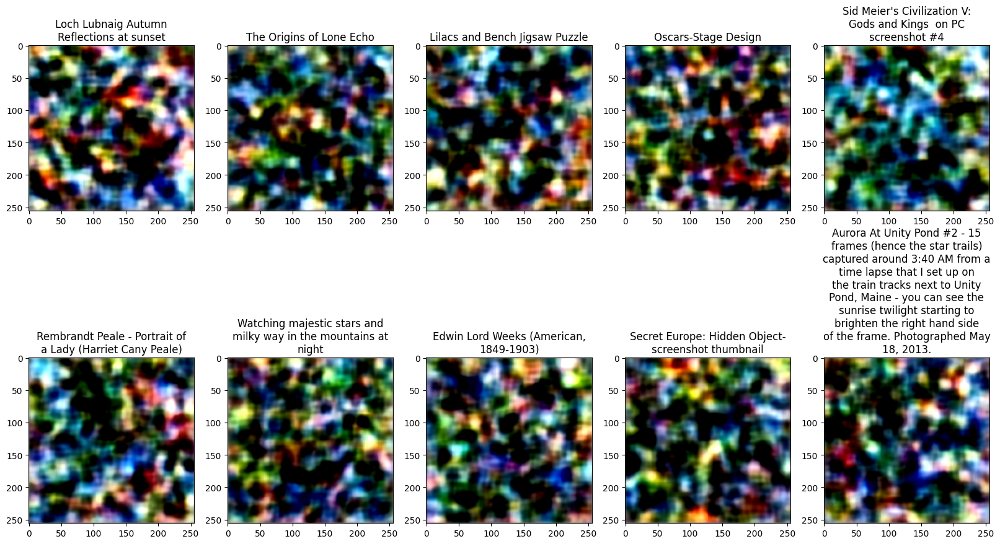

Epoch 1/1250, 1039/1024: noise_loss: 0.5625: 100%|██████████| 1024/1024 [36:18<00:00,  2.13s/it]
wandb: WARNING Saving files without folders. If you want to preserve sub directories pass base_path to wandb.save, i.e. wandb.save("/mnt/folder/file.h5", base_path="/mnt")
100%|██████████| 200/200 [00:34<00:00,  5.77it/s]


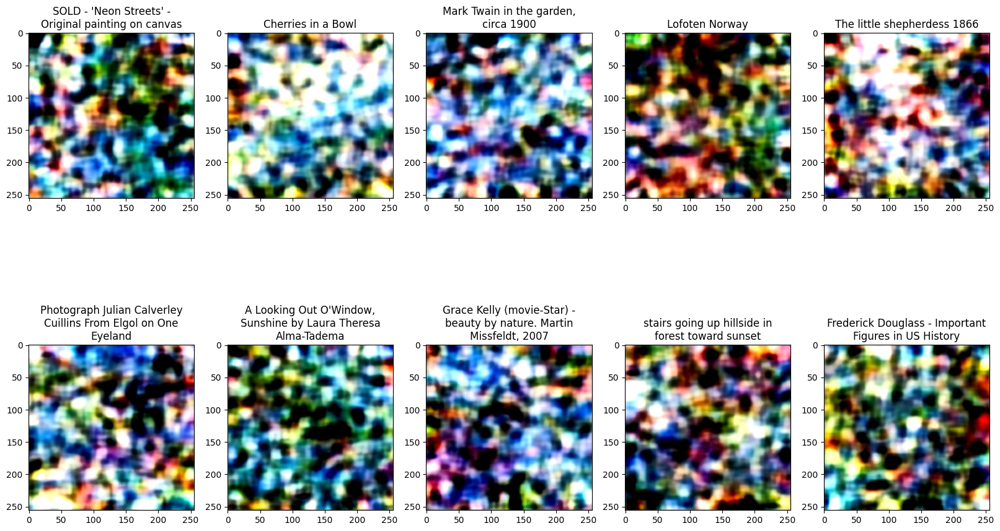

Epoch 2/1250, 1039/1024: noise_loss: 0.459: 100%|██████████| 1024/1024 [23:08<00:00,  1.36s/it] 
wandb: WARNING Saving files without folders. If you want to preserve sub directories pass base_path to wandb.save, i.e. wandb.save("/mnt/folder/file.h5", base_path="/mnt")
100%|██████████| 200/200 [00:13<00:00, 15.10it/s]


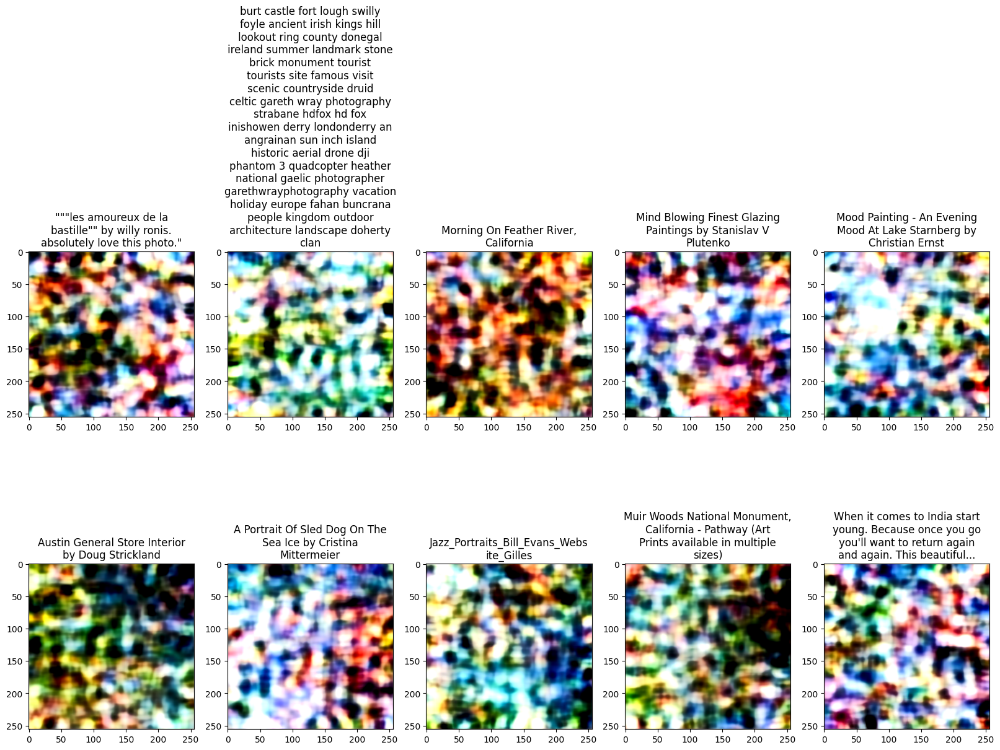

Epoch 3/1250, 1039/1024: noise_loss: 0.4258: 100%|██████████| 1024/1024 [23:08<00:00,  1.36s/it]
wandb: WARNING Saving files without folders. If you want to preserve sub directories pass base_path to wandb.save, i.e. wandb.save("/mnt/folder/file.h5", base_path="/mnt")
100%|██████████| 200/200 [00:12<00:00, 15.81it/s]


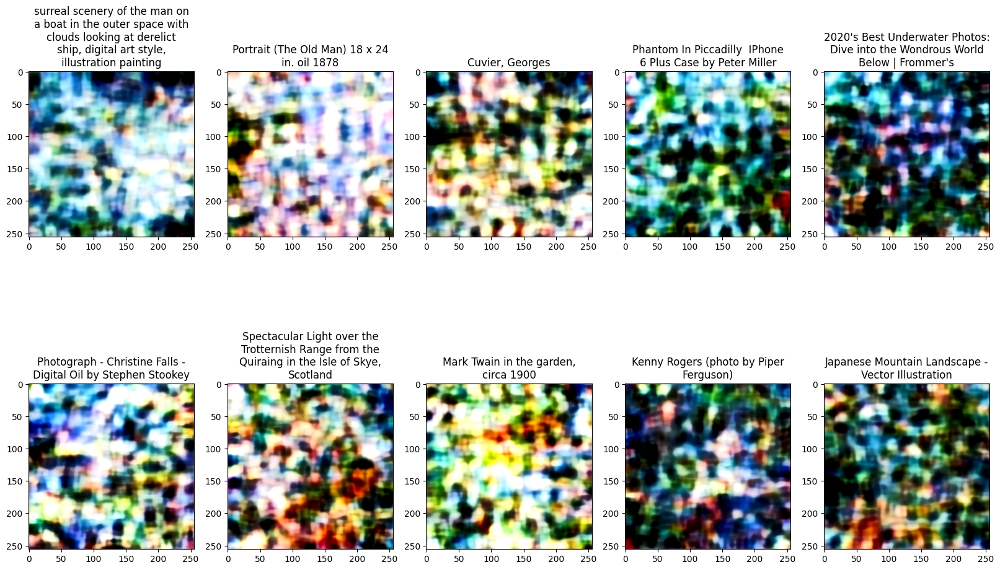

Epoch 4/1250, 1039/1024: noise_loss: 0.4961: 100%|██████████| 1024/1024 [23:11<00:00,  1.36s/it]
wandb: WARNING Saving files without folders. If you want to preserve sub directories pass base_path to wandb.save, i.e. wandb.save("/mnt/folder/file.h5", base_path="/mnt")
100%|██████████| 200/200 [00:12<00:00, 15.76it/s]


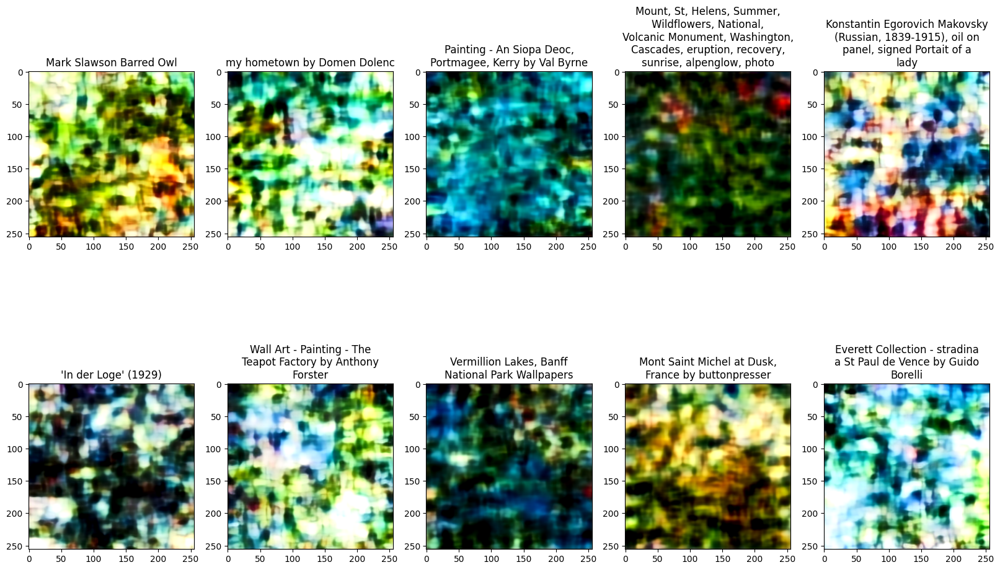

Epoch 5/1250, 1039/1024: noise_loss: 0.3809: 100%|██████████| 1024/1024 [23:08<00:00,  1.36s/it]
wandb: WARNING Saving files without folders. If you want to preserve sub directories pass base_path to wandb.save, i.e. wandb.save("/mnt/folder/file.h5", base_path="/mnt")
100%|██████████| 200/200 [00:13<00:00, 15.19it/s]


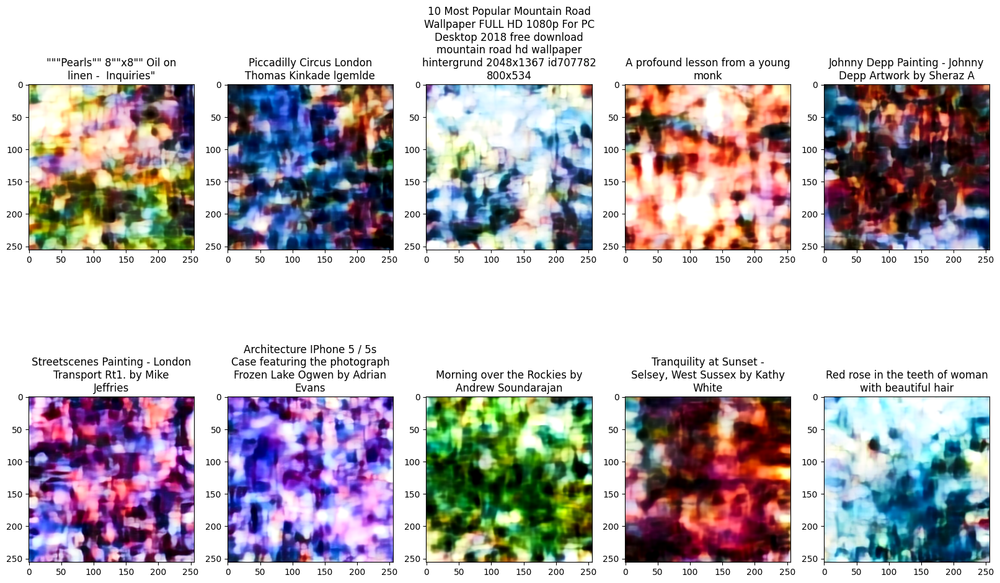

Epoch 6/1250, 1039/1024: noise_loss: 0.291: 100%|██████████| 1024/1024 [23:08<00:00,  1.36s/it] 
wandb: WARNING Saving files without folders. If you want to preserve sub directories pass base_path to wandb.save, i.e. wandb.save("/mnt/folder/file.h5", base_path="/mnt")
100%|██████████| 200/200 [00:12<00:00, 16.00it/s]


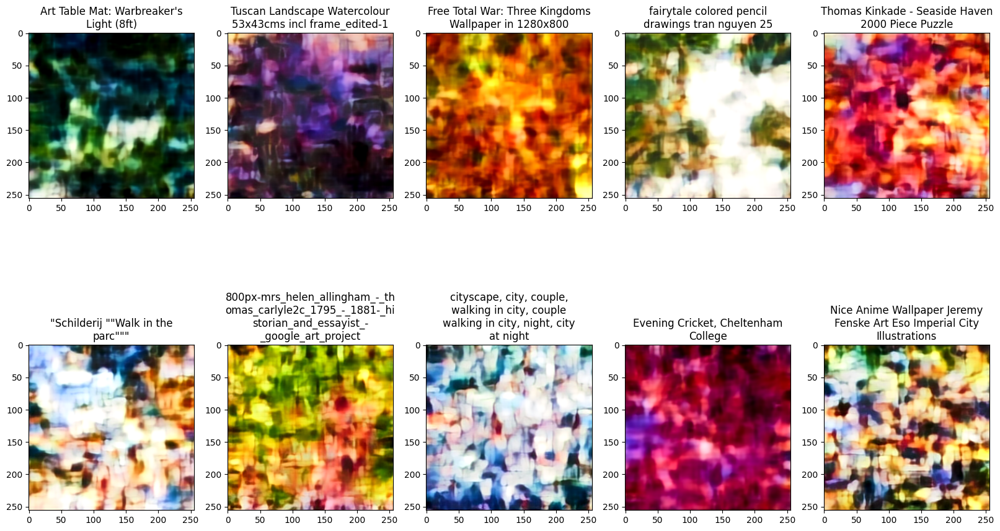

Epoch 7/1250, 1039/1024: noise_loss: 0.4062: 100%|██████████| 1024/1024 [23:08<00:00,  1.36s/it]
wandb: WARNING Saving files without folders. If you want to preserve sub directories pass base_path to wandb.save, i.e. wandb.save("/mnt/folder/file.h5", base_path="/mnt")
100%|██████████| 200/200 [00:12<00:00, 15.48it/s]


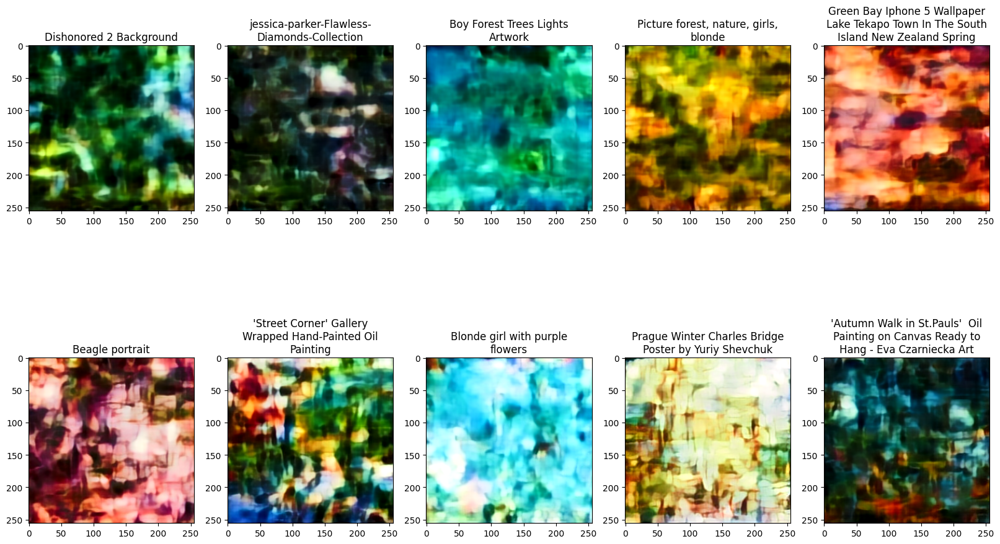

Epoch 8/1250, 1007/1024: noise_loss: 0.3887:  98%|█████████▊| 1004/1024 [22:39<00:26,  1.33s/it]

In [ ]:
if __name__ == '__main__':
    if USE_WANDB and WANDB_RUN_PATH is not None: # load DDPM checkpoint from wandb
        wandb.restore(WANDB_MODEL_FNAME, run_path=WANDB_RUN_PATH, root=CKPT_DIR)
    if USE_WANDB and WANDB_VAE_RUN_PATH is not None: # load VAE checkpoint from wandb
        wandb.restore(WANDB_VAE_MODEL_FNAME, run_path=WANDB_VAE_RUN_PATH, root=CKPT_DIR)

    # get most recent VAE checkpoint for resuming training
    VAE_CKPT_PATH = sorted(glob.glob(f'{CKPT_DIR}/vae_*.pth'))
    if VAE_CKPT_PATH != []:
        VAE_CKPT_PATH = VAE_CKPT_PATH[-1]
    else:
        VAE_CKPT_PATH = None
        print('Warning: no pretrained VAE found.')

    # get most recent DDPM checkpoint for resuming training
    CKPT_PATH = sorted(glob.glob(f'{CKPT_DIR}/ddpm_*.pth'))
    if CKPT_PATH != []:
        CKPT_PATH = CKPT_PATH[-1]
    else:
        CKPT_PATH = None
    os.makedirs(CKPT_SAVE_DIR, exist_ok=True)

    train_args = (
        EPOCHS, STEPS_PER_EPOCH,
        CROP_SIZE, BATCH_SIZE,
        LEARNING_RATE, LR_WARMUP_STEPS,
        DS_PATH,
        CKPT_SAVE_DIR, CKPT_PATH,
        VAE_CKPT_PATH
    )

    xmp.spawn(train, args=train_args, nprocs=8, start_method='fork')